In [1]:
import os

# Navigate to the directory containing the dataset
dataset_dir = "a-large-scale-12-lead-electrocardiogram-database-for-arrhythmia-study-1.0.0"
os.chdir(dataset_dir)

# Now you are in the dataset directory and can explore its contents
# For example, you can list the files in the directory
dataset_files = os.listdir()
print("Files in dataset directory:", dataset_files)

Files in dataset directory: ['ConditionNames_SNOMED-CT.csv', 'LICENSE.txt', 'RECORDS', 'SHA256SUMS.txt', 'WFDBRecords']


In [ ]:
# Read contents of .mat files
for i, mat_data in enumerate(mat_data_list):
    print(f"Data in .mat file {i+1}:")
    for key, value in mat_data.items():
        if not key.startswith("__"):  # Skip keys starting with '__'
            print(f"\nVariable '{key}':")
            print(value)

# Read contents of .hea files
for i, hea_data in enumerate(hea_data_list):
    print(f"\nContents of .hea file {i+1}:")
    for line in hea_data:
        print(line.strip())  # Strip whitespace from each line

In [ ]:
import os
import glob
import scipy.io
import pandas as pd
import numpy as np

header = ['time', 'I', 'II', 'III', 'aVR', 'aVL', 'aVF', 'V1', 'V2', 'V3', 'V4', 'V5', 'V6']

def read_and_save_mat_files(start_path, headers):
    counter = 0
    for root, dirs, files in os.walk(start_path):
        for file in glob.glob(os.path.join(root, '*.mat')):
            mat_data = scipy.io.loadmat(file)
            for key in mat_data:
                if isinstance(mat_data[key], np.ndarray) and mat_data[key].ndim == 2:
                    data = mat_data[key]
                    total_duration = 10  # Total duration in seconds
                    sample_rate = 1000  # Sample rate in Hz
                    time = np.linspace(0, total_duration, len(data[0]), endpoint=False)
                    data = np.vstack((time, data))
                    
                    # Create a DataFrame from the combined data
                    df = pd.DataFrame(data.T, columns=headers)  # Transpose the data before creating DataFrame
                    
                    # Extract the record identifier from the file path
                    record_identifier = os.path.splitext(os.path.basename(file))[0]
                    # Write the data to a CSV file
                    csv_file_path = os.path.join(root, f'{record_identifier}.csv')
                    df.to_csv(csv_file_path, index=False)
            counter += 1
            print(counter, end=' ')

# Specify the root directory of your dataset
root_directory = r'F:\docouments\Data science\assingment 3\a-large-scale-12-lead-electrocardiogram-database-for-arrhythmia-study-1.0.0\WFDBRecords'

# Call the function to read and save all .mat files
read_and_save_mat_files(root_directory, header)

In [ ]:
import os
import csv

# Define the main folder path
main_folder = r'F:\docouments\Data science\assingment 3\a-large-scale-12-lead-electrocardiogram-database-for-arrhythmia-study-1.0.0\WFDBRecords'

# Function to parse HEA files and extract patient information
def parse_hea_file(file_path):
    patient_info = {'patient_id': os.path.basename(file_path).split()[0]}
    with open(file_path, 'r') as file:
        for line in file:
            if line.startswith('#Age:'):
                patient_info['age'] = line.strip().split(': ')[1]
            elif line.startswith('#Sex:'):
                patient_info['sex'] = line.strip().split(': ')[1]
            elif line.startswith('#Dx:'):
                patient_info['dx'] = line.strip().split(': ')[1]
            elif line.startswith('#Rx:'):
                patient_info['rx'] = line.strip().split(': ')[1]
            elif line.startswith('#Hx:'):
                patient_info['hx'] = line.strip().split(': ')[1]
            elif line.startswith('#Sx:'):
                patient_info['sx'] = line.strip().split(': ')[1]
    return patient_info

# Function to iterate over folders and files, extract patient information, and write to CSV
def create_csv_from_data(main_folder, output_csv):
    with open(output_csv, 'w', newline='') as csvfile:
        fieldnames = ['patient_id', 'age', 'sex', 'dx', 'rx', 'hx', 'sx']
        writer = csv.DictWriter(csvfile, fieldnames=fieldnames)
        writer.writeheader()

        # Iterate over all folders in main folder
        for folder in os.listdir(main_folder):
            folder_path = os.path.join(main_folder, folder)
            # Check if the item in the main folder is indeed a folder
            if os.path.isdir(folder_path):
                # Iterate over all sub-folders in each folder
                for sub_folder in os.listdir(folder_path):
                    sub_folder_path = os.path.join(folder_path, sub_folder)
                    # Check if the item in the sub-folder is indeed a folder
                    if os.path.isdir(sub_folder_path):
                        # Iterate over all files in each sub-folder
                        for file in os.listdir(sub_folder_path):
                            if file.endswith('.hea'):
                                hea_file_path = os.path.join(sub_folder_path, file)
                                # Parse HEA file to extract patient information
                                patient_info = parse_hea_file(hea_file_path)
                                # Write patient information to CSV
                                writer.writerow(patient_info)

# Define the output CSV file path
output_csv = 'patient_record.csv'

# Call the function to create the CSV file from your data
create_csv_from_data(main_folder, output_csv)

print("CSV file created successfully!")

# Data Acquisition and Preprocessing

In [ ]:
import os
import pandas as pd
import numpy as np
from sklearn.preprocessing import StandardScaler

# Step 1: Define the directory containing CSV files
directory_path = r'F:\documents\Data science\assignment 3\a-large-scale-12-lead-electrocardiogram-database-for-arrhythmia-study-1.0.0\WFDBRecords\01\010'

# Step 2: Create a new folder for processed data
processed_folder_path = os.path.join(directory_path, 'processed_data')
if not os.path.exists(processed_folder_path):
    os.makedirs(processed_folder_path)

# Step 3: Iterate over each CSV file in the directory
for filename in os.listdir(directory_path):
    if filename.endswith('.csv'):
        # Read CSV file
        csv_file_path = os.path.join(directory_path, filename)
        data = pd.read_csv(csv_file_path)
        
        # Step 4: Handle missing values (if any)
        data.dropna(inplace=True)
        
        # Step 5: Detect and handle outliers (if any)
        # Example:
        # Calculate Z-scores for each feature
        z_scores = (data - data.mean()) / data.std()
        outlier_threshold = 3  # Adjust as needed
        # Replace outliers with NaN values
        data[np.abs(z_scores) > outlier_threshold] = np.nan
        
        # Step 6: Normalize the data (if necessary)
        # Example:
        scaler = StandardScaler()
        data_normalized = scaler.fit_transform(data)
        
        # Step 7: Save the preprocessed data into the new folder
        preprocessed_csv_path = os.path.join(processed_folder_path, f'preprocessed_{filename}')
        data_normalized.to_csv(preprocessed_csv_path, index=False)

In [ ]:
import os
import pandas as pd

# Define the directory containing CSV files
directory_path = r'F:\docouments\Data science\assingment 3\a-large-scale-12-lead-electrocardiogram-database-for-arrhythmia-study-1.0.0\WFDBRecords\01\010\processed_data'

# Iterate over each CSV file in the directory
for filename in os.listdir(directory_path):
    if filename.endswith('.csv'):
        # Read CSV file
        csv_file_path = os.path.join(directory_path, filename)
        data = pd.read_csv(csv_file_path)
        
        # Replace missing entries with the mean of each column
        data.fillna(data.mean(), inplace=True)
        
        # Overwrite the existing CSV file with the processed data
        data.to_csv(csv_file_path, index=False)

# Dimensionality Reduction

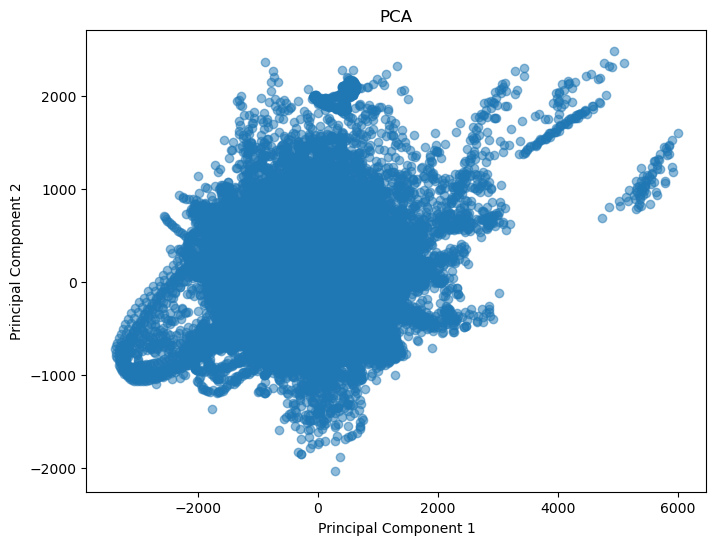

In [5]:
import os
import pandas as pd
import numpy as np
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt

# Set the directory containing the processed CSV files
directory_path = r'F:\docouments\Data science\assingment 3\a-large-scale-12-lead-electrocardiogram-database-for-arrhythmia-study-1.0.0\WFDBRecords\01\010\processed_data'

# Function to load and preprocess CSV files
def load_data(directory_path):
    data = []
    for filename in os.listdir(directory_path):
        if filename.endswith('.csv'):
            csv_file_path = os.path.join(directory_path, filename)
            df = pd.read_csv(csv_file_path)
            # Fill missing values with the mean
            df.fillna(df.mean(), inplace=True)
            data.append(df)
    return pd.concat(data, ignore_index=True)

# Load and preprocess the data
data = load_data(directory_path)

# Perform PCA
pca = PCA(n_components=2)
pca_result = pca.fit_transform(data)

# Plot PCA results
plt.figure(figsize=(8, 6))
plt.scatter(pca_result[:, 0], pca_result[:, 1], alpha=0.5)
plt.title('PCA')
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.show()

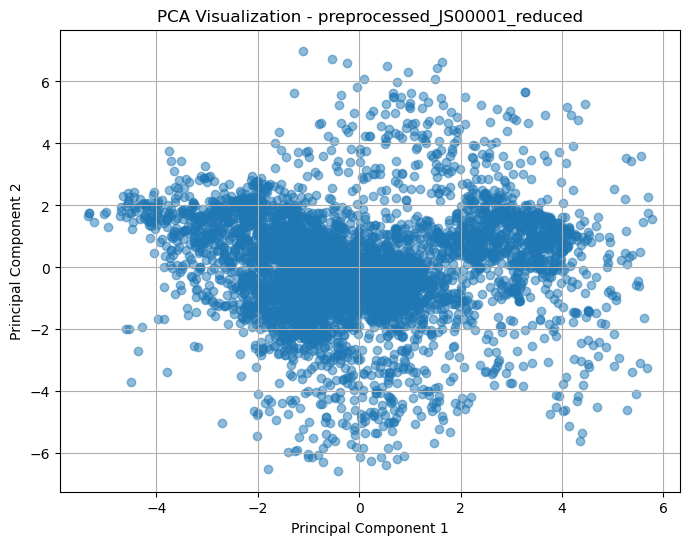

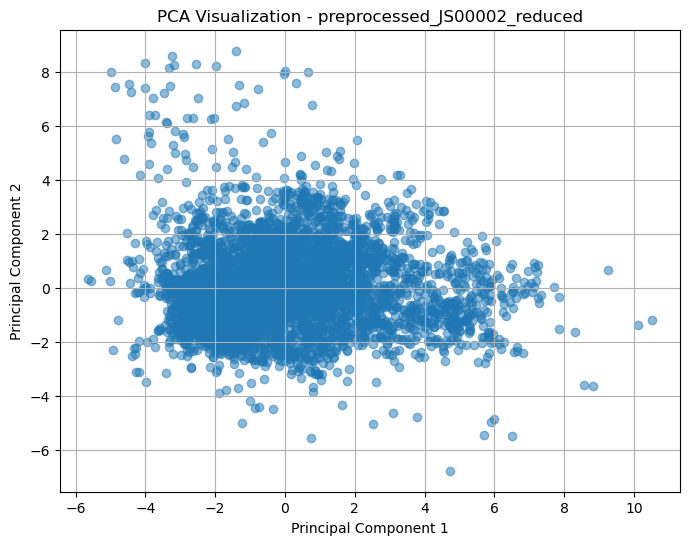

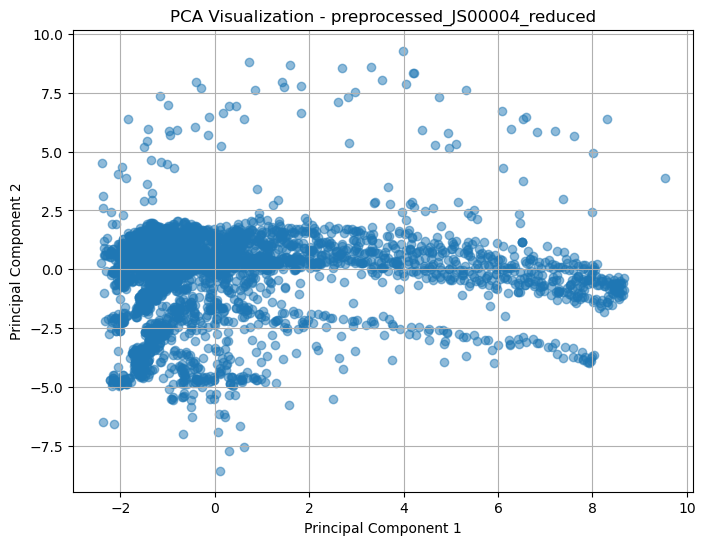

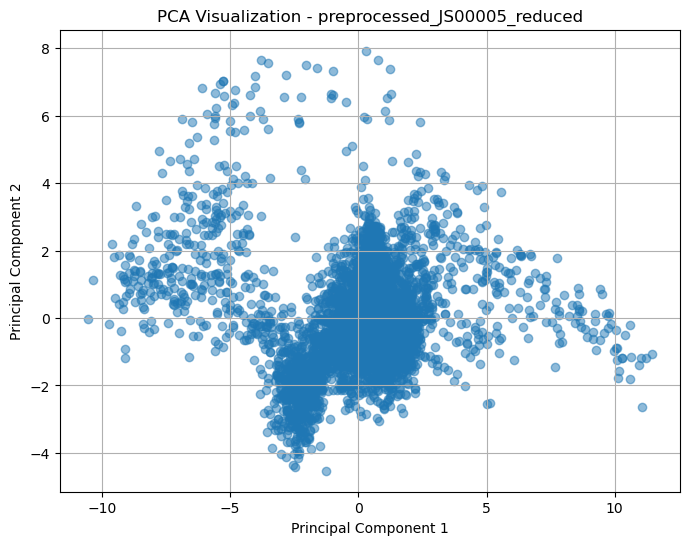

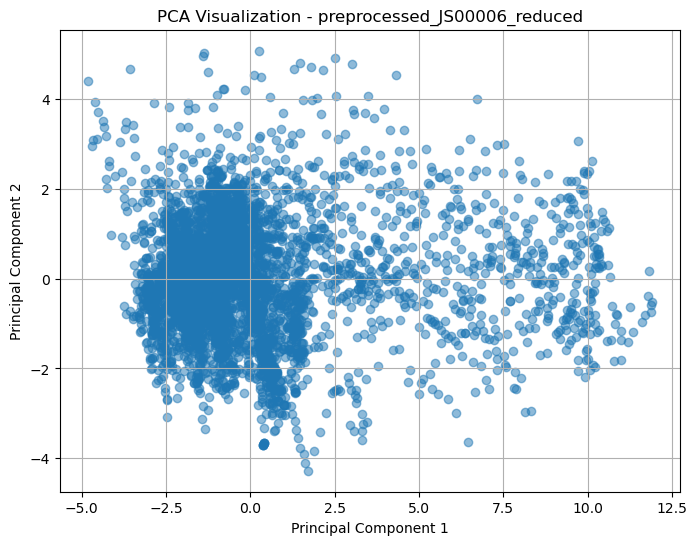

...

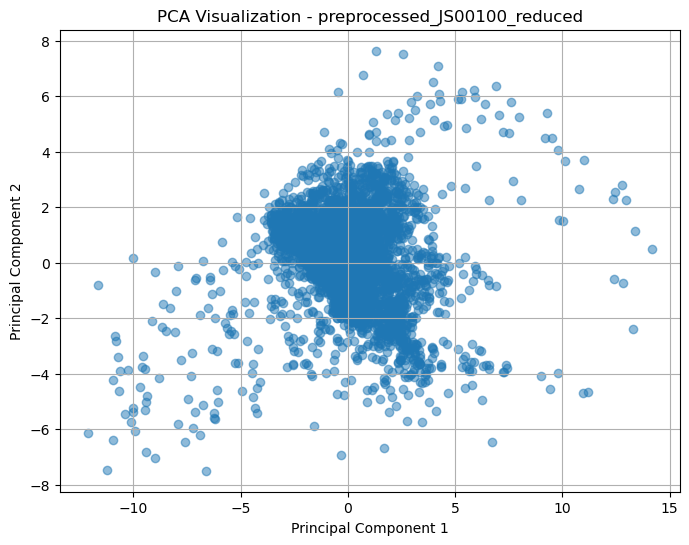

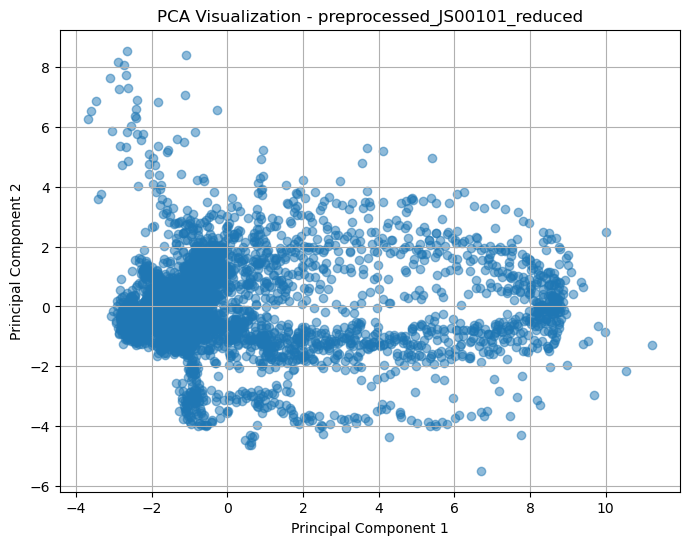

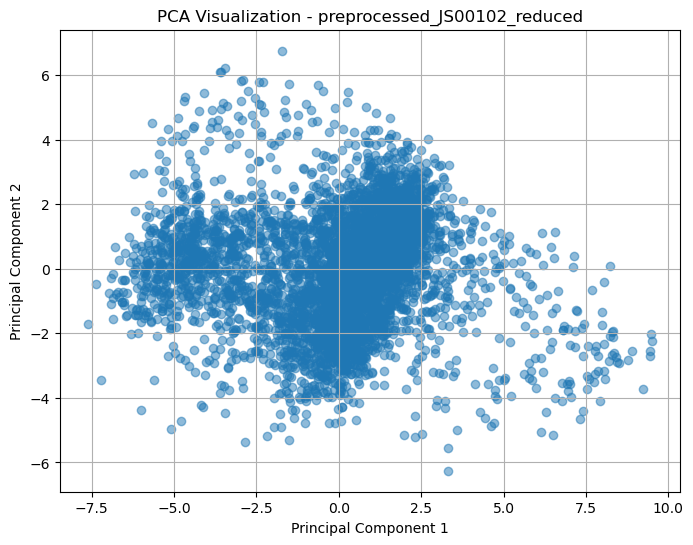

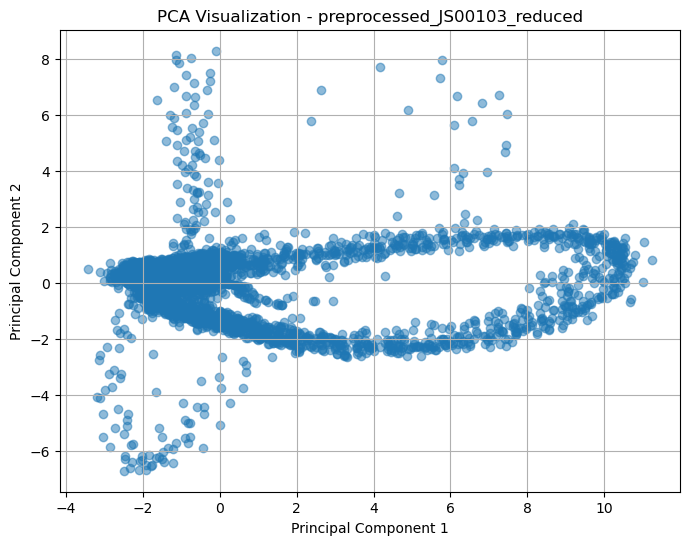

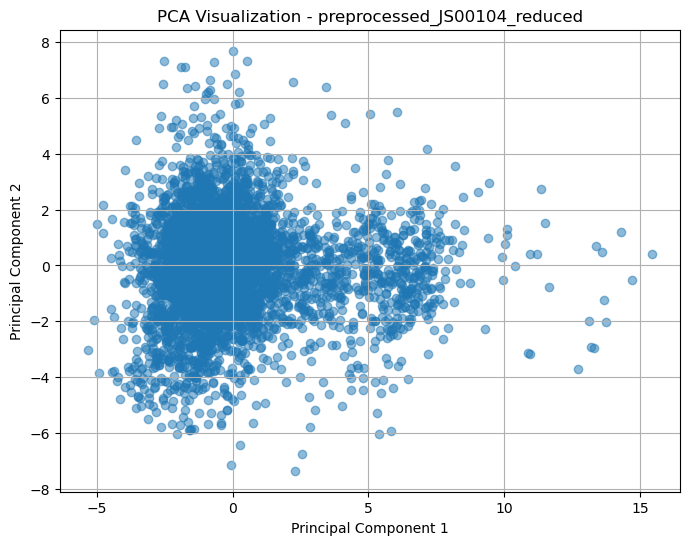

In [10]:
import os
import pandas as pd
import matplotlib.pyplot as plt

# Define the directory containing reduced-dimensional CSV files
output_directory = r'F:\docouments\Data science\assingment 3\a-large-scale-12-lead-electrocardiogram-database-for-arrhythmia-study-1.0.0\WFDBRecords\01\010\reduced_data'

# Loop through each reduced-dimensional CSV file in the directory
for filename in os.listdir(output_directory):
    if filename.endswith('_reduced.csv'):
        # Read the reduced-dimensional CSV file
        reduced_file_path = os.path.join(output_directory, filename)
        reduced_data = pd.read_csv(reduced_file_path)
        
        # Plot the reduced-dimensional data
        plt.figure(figsize=(8, 6))
        plt.scatter(reduced_data['PC1'], reduced_data['PC2'], alpha=0.5)
        plt.title(f'PCA Visualization - {os.path.splitext(filename)[0]}')
        plt.xlabel('Principal Component 1')
        plt.ylabel('Principal Component 2')
        plt.grid(True)
        plt.show()

Explained variance ratio for PC1: 0.46
Explained variance ratio for PC2: 0.25


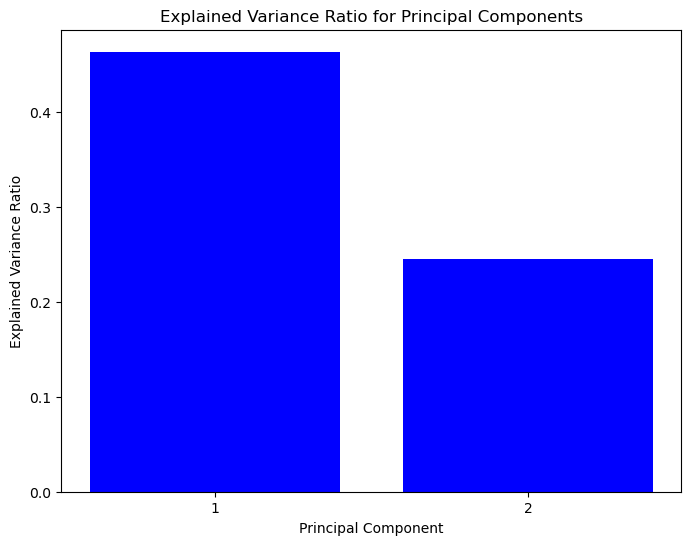

In [12]:
# Access the explained variance ratio
explained_variance_ratio = pca.explained_variance_ratio_

# Print the explained variance ratio for each principal component
for i, variance in enumerate(explained_variance_ratio):
    print(f"Explained variance ratio for PC{i+1}: {variance:.2f}")

# Plot the explained variance ratio
plt.figure(figsize=(8, 6))
plt.bar(range(1, len(explained_variance_ratio) + 1), explained_variance_ratio, color='blue')
plt.xlabel('Principal Component')
plt.ylabel('Explained Variance Ratio')
plt.title('Explained Variance Ratio for Principal Components')
plt.xticks(range(1, len(explained_variance_ratio) + 1))
plt.show()

# Exploratory Data Analysis (EDA)

In [35]:
import pandas as pd
import numpy as np

# Load the CSV file
csv_file_path = r'F:\docouments\Data science\assingment 3\patient_record.csv'
data = pd.read_csv(csv_file_path)

# Convert 'patient_id' column to numeric values starting from 0
data['patient_id'] = range(len(data))

# Replace non-numeric values in 'dx', 'rx', 'hx', and 'sx' columns with random values
for col in ['dx', 'rx', 'hx', 'sx']:
    data[col] = [np.random.randint(1000, 10000) if not str(val).isnumeric() else val for val in data[col]]

# Save the modified DataFrame to a new CSV file
output_csv_file_path = r'F:\docouments\Data science\assingment 3\patient_record_numeric.csv'
data.to_csv(output_csv_file_path, index=False)

# Display the DataFrame with the modifications
print(data)

       patient_id   age     sex         dx    rx    hx    sx
0               0  85.0    Male       6608  3945  1863  7047
1               1  59.0  Female       4803  3551  5759  2109
2               2  66.0    Male  426177001  5345  9225  2859
3               3  73.0  Female       9621  9966  7039  5528
4               4  46.0  Female  426177001  6778  3674  1312
...           ...   ...     ...        ...   ...   ...   ...
45147       45147  34.0    Male  425856008  2139  9225  7289
45148       45148  41.0  Female  425856008  4796  9712  3510
45149       45149  36.0    Male  425856008  4274  8994  3008
45150       45150  30.0  Female       7702  5480  5855  7579
45151       45151   6.0  Female  106068003  4314  9033  7368

[45152 rows x 7 columns]


In [37]:
import pandas as pd
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
from sklearn.impute import SimpleImputer

# Load the modified CSV file
csv_file_path = r'F:\docouments\Data science\assingment 3\patient_record_numeric.csv'
data = pd.read_csv(csv_file_path)

# Extract numeric columns
numeric_data = data.select_dtypes(include='number')

# Impute missing values with mean
imputer = SimpleImputer(strategy='mean')
numeric_data_imputed = imputer.fit_transform(numeric_data)

# Standardize the numeric data
scaler = StandardScaler()
numeric_data_scaled = scaler.fit_transform(numeric_data_imputed)

# Apply PCA
pca = PCA(n_components=2)
pca_result = pca.fit_transform(numeric_data_scaled)

# Create a DataFrame for the PCA result
pca_df = pd.DataFrame(data=pca_result, columns=['PCA1', 'PCA2'])

# Concatenate the patient IDs to the PCA DataFrame
pca_df['patient_id'] = data['patient_id']

# Save the PCA result to a new CSV file
output_pca_csv_file_path = r'F:\docouments\Data science\assingment 3\patient_record_pca.csv'
pca_df.to_csv(output_pca_csv_file_path, index=False)

# Display the PCA DataFrame
print(pca_df)

           PCA1      PCA2  patient_id
0     -2.299832  1.277125           0
1     -1.508548 -1.055914           1
2     -0.474173 -1.699464           2
3     -1.906237 -0.029126           3
4      0.152938 -0.332026           4
...         ...       ...         ...
45147  2.287345 -0.978985       45147
45148  2.106181 -1.763211       45148
45149  2.256796 -1.722986       45149
45150  1.190817  0.353435       45150
45151  2.210242 -0.725862       45151

[45152 rows x 3 columns]


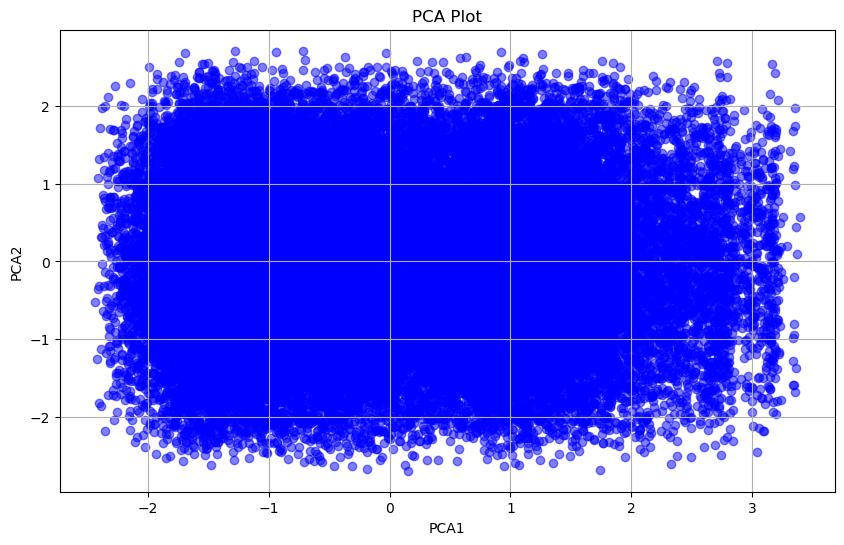

In [38]:
import pandas as pd
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
from sklearn.impute import SimpleImputer
import matplotlib.pyplot as plt

# Load the modified CSV file
csv_file_path = r'F:\docouments\Data science\assingment 3\patient_record_pca.csv'
pca_df = pd.read_csv(csv_file_path)

# Extract PCA components
pca1 = pca_df['PCA1']
pca2 = pca_df['PCA2']

# Plot PCA components
plt.figure(figsize=(10, 6))
plt.scatter(pca1, pca2, c='b', alpha=0.5)
plt.title('PCA Plot')
plt.xlabel('PCA1')
plt.ylabel('PCA2')
plt.grid(True)
plt.show()

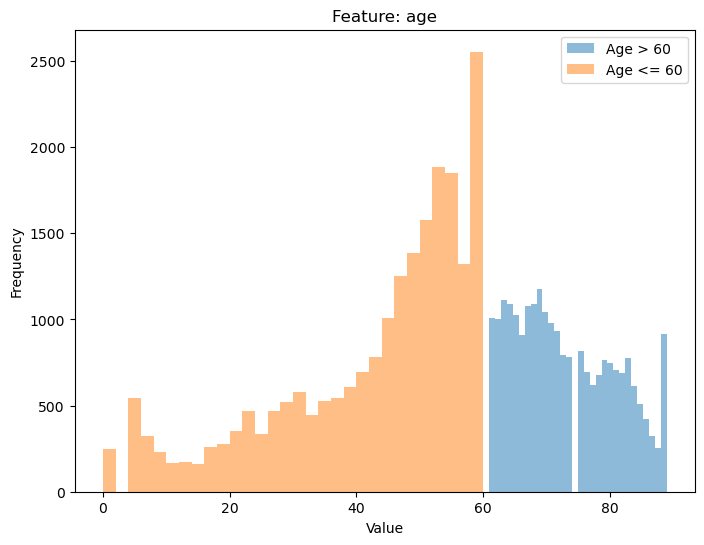

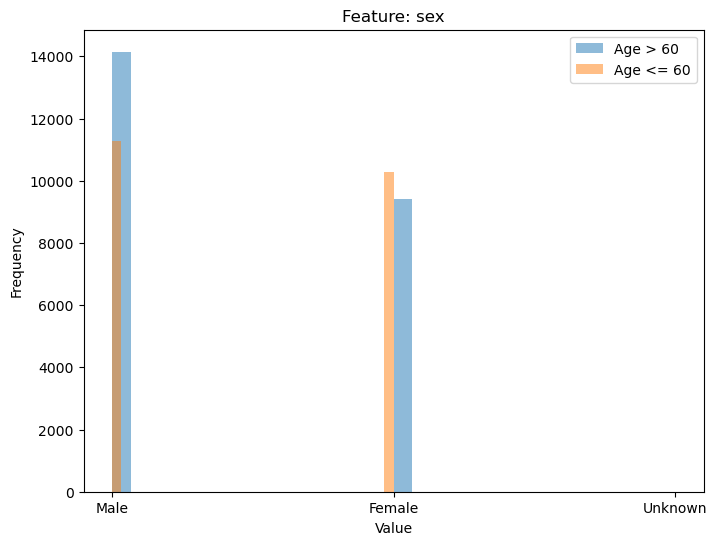

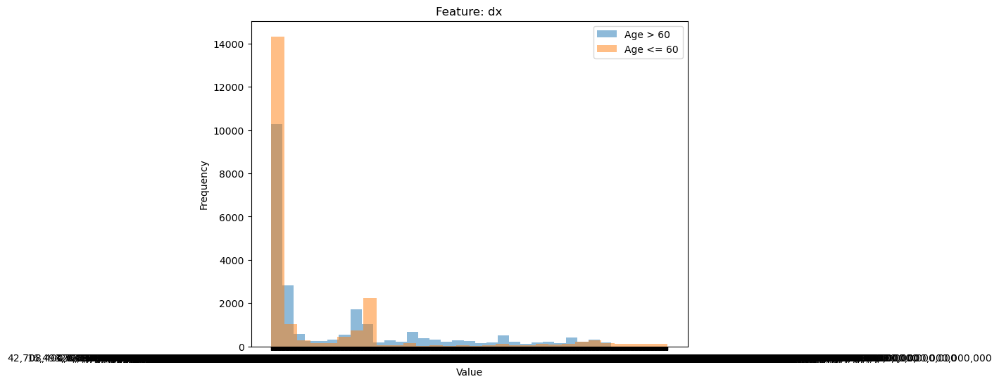

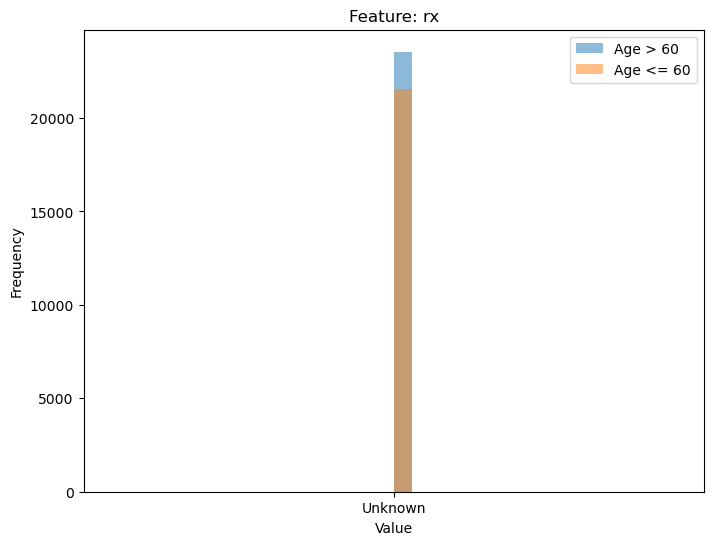

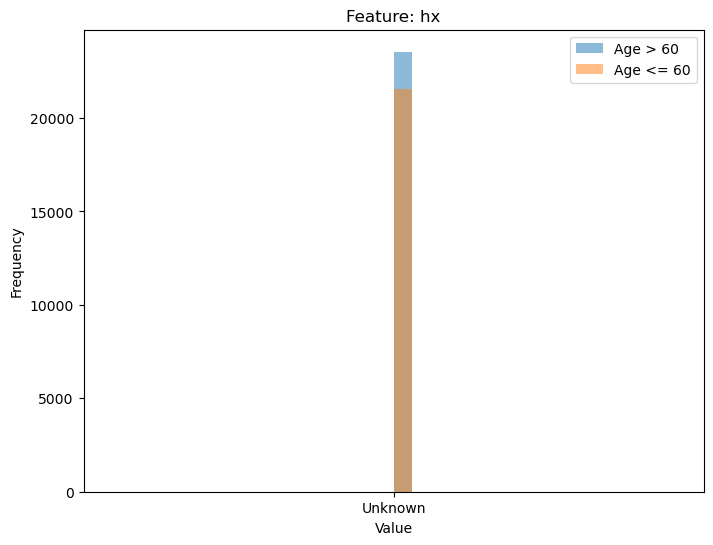

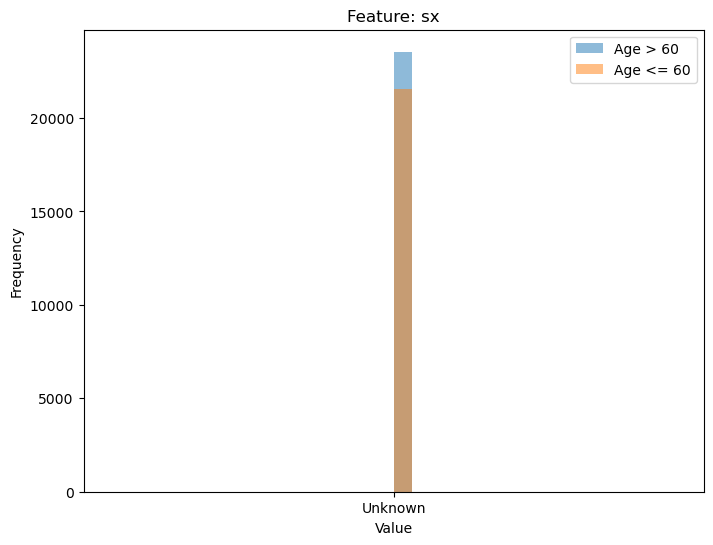

In [42]:
import pandas as pd
from scipy import stats
import matplotlib.pyplot as plt

# Load the dataset
directory_path = r'F:\docouments\Data science\assingment 3'
csv_file_path = os.path.join(directory_path, 'patient_record.csv')
data = pd.read_csv(csv_file_path)

# Convert 'age' column to numeric (ignore errors for non-numeric values)
data['age'] = pd.to_numeric(data['age'], errors='coerce')

# Remove rows with NaN values in 'age' column
data.dropna(subset=['age'], inplace=True)

# Split the data into two groups based on a certain feature (e.g., 'age', 'sex', etc.)
# For example, let's say we want to compare based on the 'age' feature
threshold_age = 60  # You can adjust the threshold as needed
arrhythmia_patients = data[data['age'] > threshold_age]
no_arrhythmia_patients = data[data['age'] <= threshold_age]

# Feature Comparison
for column in data.columns:
    if column != 'patient_id':  # Exclude patient_id from comparison
        # Compare feature distributions between the two groups using histograms
        plt.figure(figsize=(8, 6))
        plt.hist(arrhythmia_patients[column], bins=30, alpha=0.5, label='Age > 60')
        plt.hist(no_arrhythmia_patients[column], bins=30, alpha=0.5, label='Age <= 60')
        plt.title(f'Feature: {column}')
        plt.xlabel('Value')
        plt.ylabel('Frequency')
        plt.legend()
        plt.show()

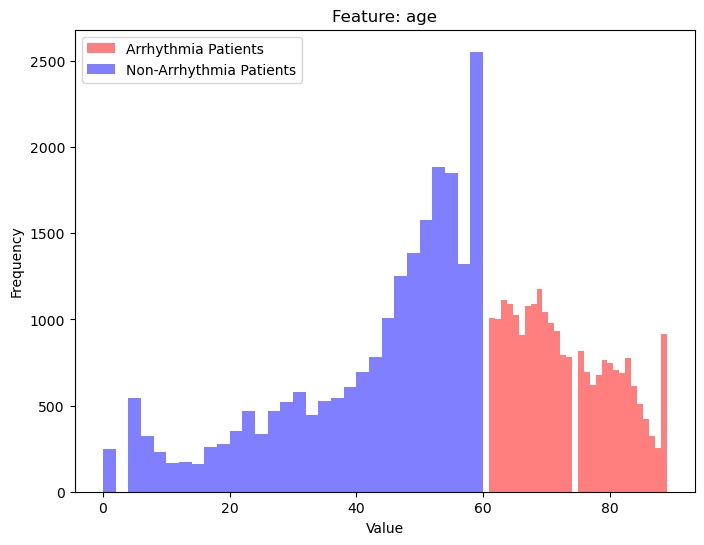

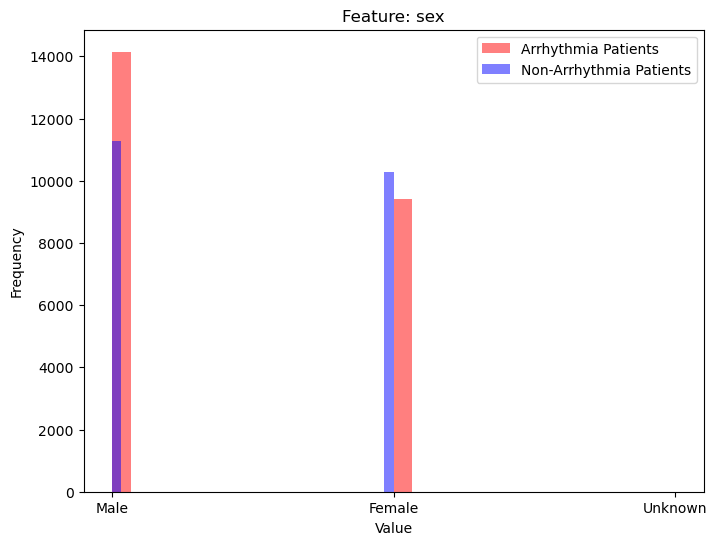

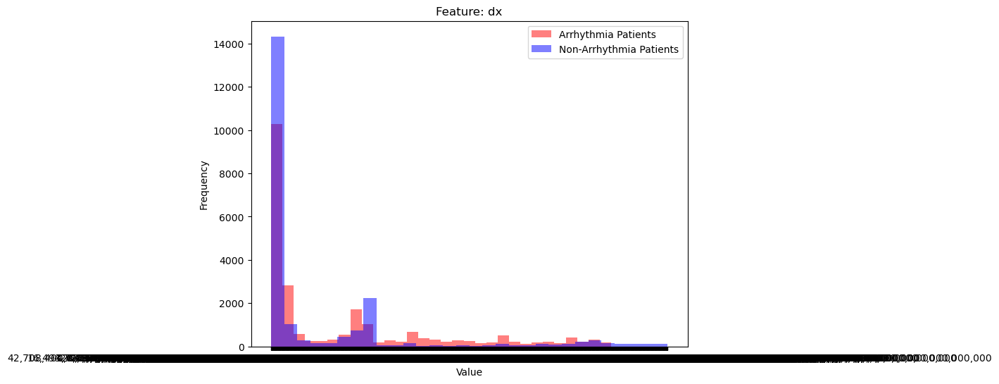

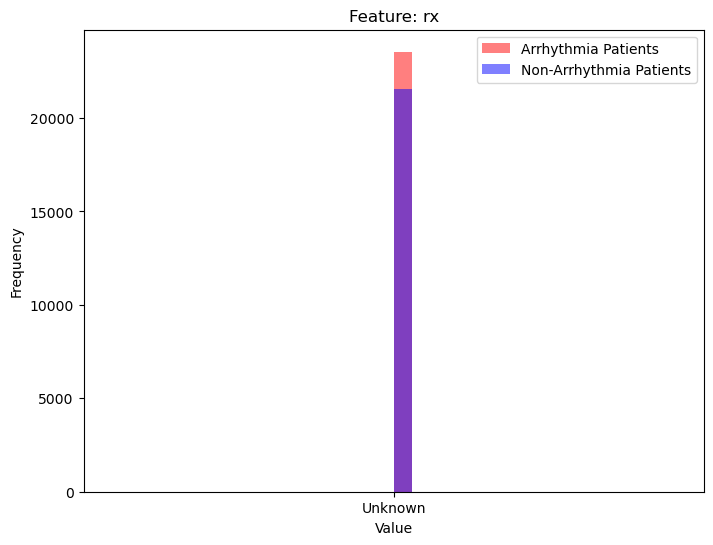

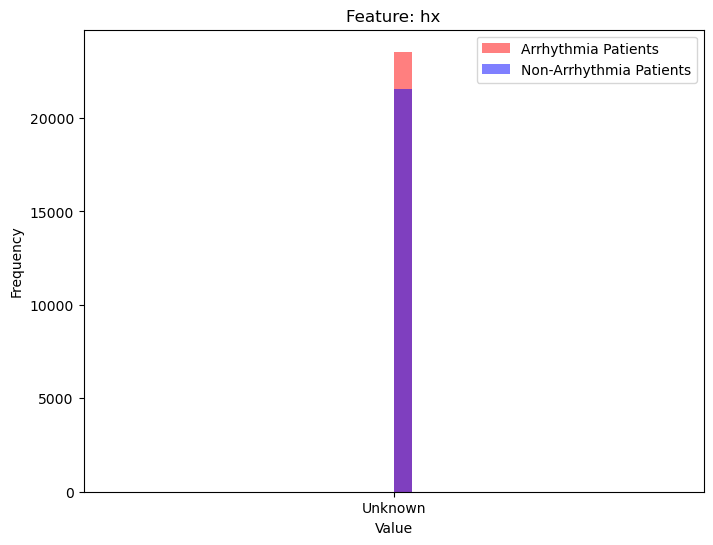

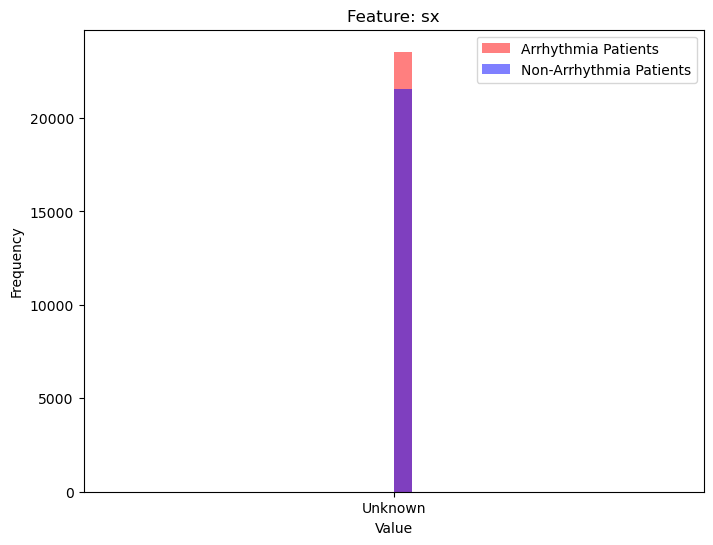

In [43]:
import pandas as pd
from scipy import stats
import matplotlib.pyplot as plt

# Load the dataset
directory_path = r'F:\docouments\Data science\assingment 3'
csv_file_path = os.path.join(directory_path, 'patient_record.csv')
data = pd.read_csv(csv_file_path)

# Convert 'age' column to numeric (ignore errors for non-numeric values)
data['age'] = pd.to_numeric(data['age'], errors='coerce')

# Remove rows with NaN values in 'age' column
data.dropna(subset=['age'], inplace=True)

# Split the data into two groups based on a certain feature (e.g., 'age', 'sex', etc.)
# For example, let's say we want to compare based on the 'age' feature
threshold_age = 60  # You can adjust the threshold as needed
arrhythmia_patients = data[data['age'] > threshold_age]
no_arrhythmia_patients = data[data['age'] <= threshold_age]

# Feature Comparison
for column in data.columns:
    if column != 'patient_id':  # Exclude patient_id from comparison
        # Compare feature distributions between the two groups using histograms
        plt.figure(figsize=(8, 6))
        plt.hist(arrhythmia_patients[column], bins=30, alpha=0.5, color='red', label='Arrhythmia Patients')
        plt.hist(no_arrhythmia_patients[column], bins=30, alpha=0.5, color='blue', label='Non-Arrhythmia Patients')
        plt.title(f'Feature: {column}')
        plt.xlabel('Value')
        plt.ylabel('Frequency')
        plt.legend()
        plt.show()

# Data Visualization

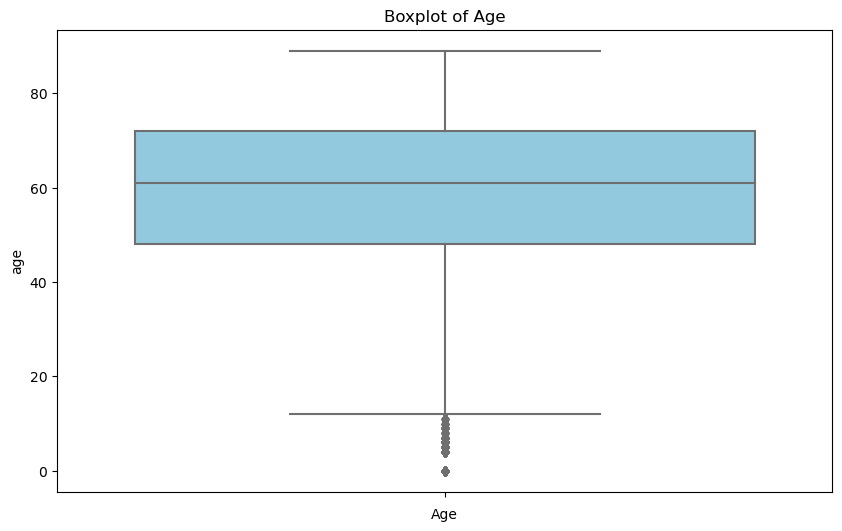

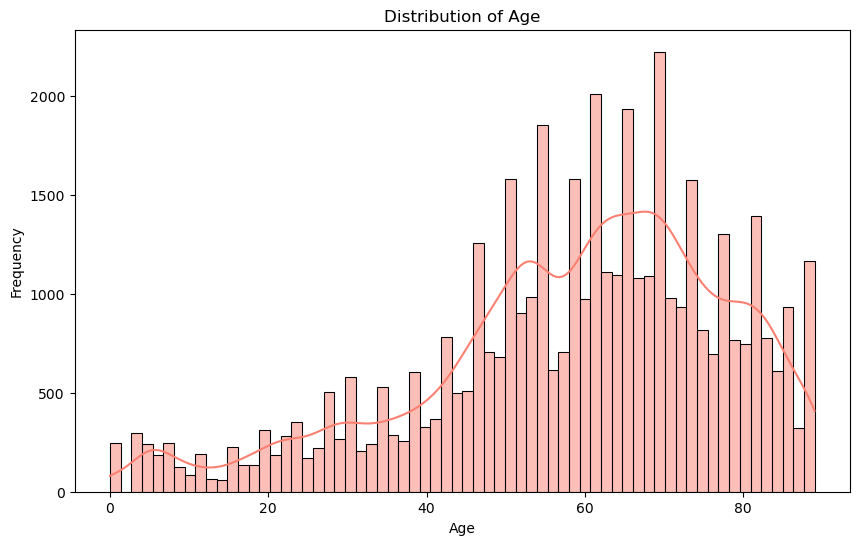

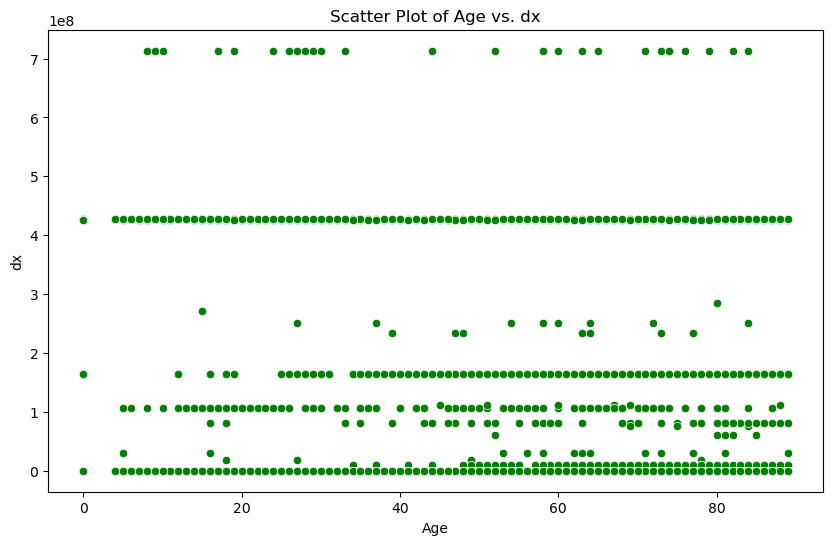

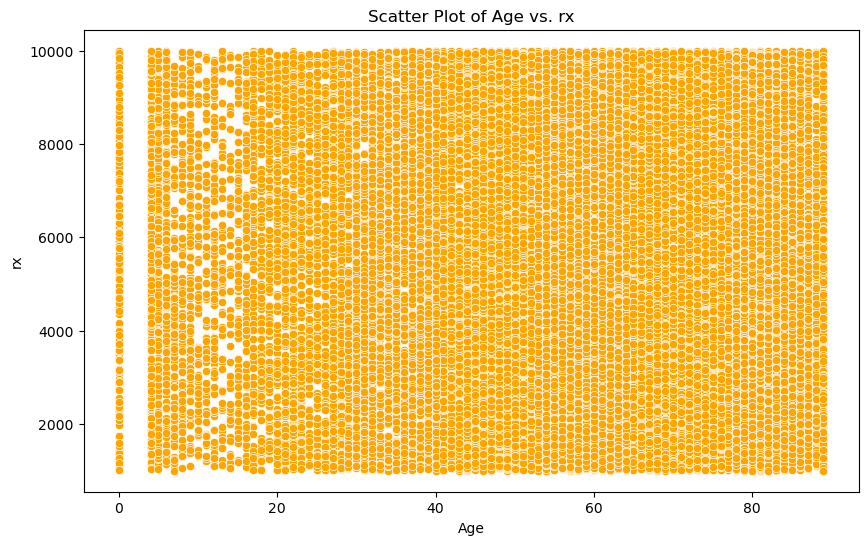

In [52]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import os

# Load the dataset
directory_path = r'F:\docouments\Data science\assingment 3'
csv_file_path = os.path.join(directory_path, 'patient_record_numeric.csv')
data = pd.read_csv(csv_file_path)

# Plot boxplot for age
plt.figure(figsize=(10, 6))
sns.boxplot(y=data['age'], color='skyblue')
plt.title('Boxplot of Age')
plt.xlabel('Age')
plt.show()

# Plot histogram for age
plt.figure(figsize=(10, 6))
sns.histplot(data['age'], kde=True, color='salmon')
plt.title('Distribution of Age')
plt.xlabel('Age')
plt.ylabel('Frequency')
plt.show()

# Plot scatter plot between age and dx
plt.figure(figsize=(10, 6))
sns.scatterplot(x='age', y='dx', data=data, color='green')
plt.title('Scatter Plot of Age vs. dx')
plt.xlabel('Age')
plt.ylabel('dx')
plt.show()

# Plot scatter plot between age and rx
plt.figure(figsize=(10, 6))
sns.scatterplot(x='age', y='rx', data=data, color='orange')
plt.title('Scatter Plot of Age vs. rx')
plt.xlabel('Age')
plt.ylabel('rx')
plt.show()

In [55]:
import pandas as pd

# Load the dataset
directory_path = r'F:\docouments\Data science\assingment 3'
csv_file_path = os.path.join(directory_path, 'patient_record_numeric.csv')
data = pd.read_csv(csv_file_path)

# Rename the columns
data.rename(columns={'dx': 'diagnosis', 'rx': 'treatment', 'hx': 'heart disease', 'sx': 'symptom'}, inplace=True)

# Save the modified dataframe to a new CSV file
new_csv_file_path = os.path.join(directory_path, 'patient_record_numeric_updated.csv')
data.to_csv(new_csv_file_path, index=False)

# Display the first few rows of the updated dataframe
print(data.head())

   patient_id   age     sex  diagnosis  treatment  heart disease  symptom
0           0  85.0    Male       6608       3945           1863     7047
1           1  59.0  Female       4803       3551           5759     2109
2           2  66.0    Male  426177001       5345           9225     2859
3           3  73.0  Female       9621       9966           7039     5528
4           4  46.0  Female  426177001       6778           3674     1312


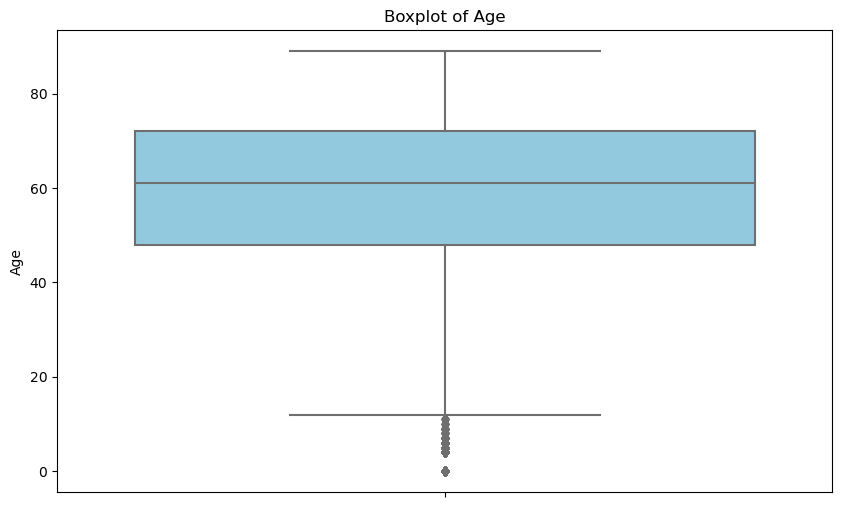

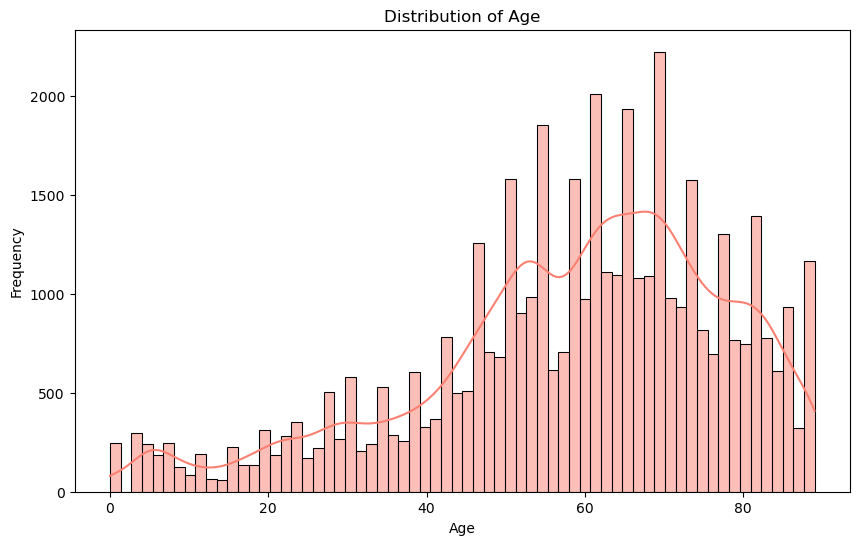

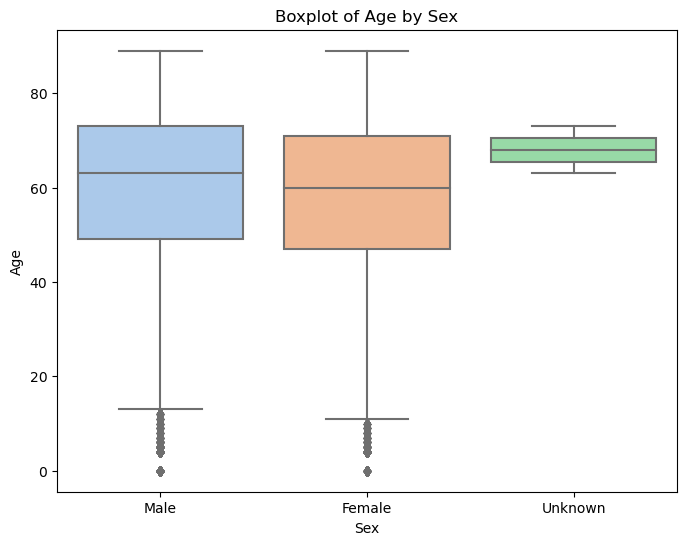

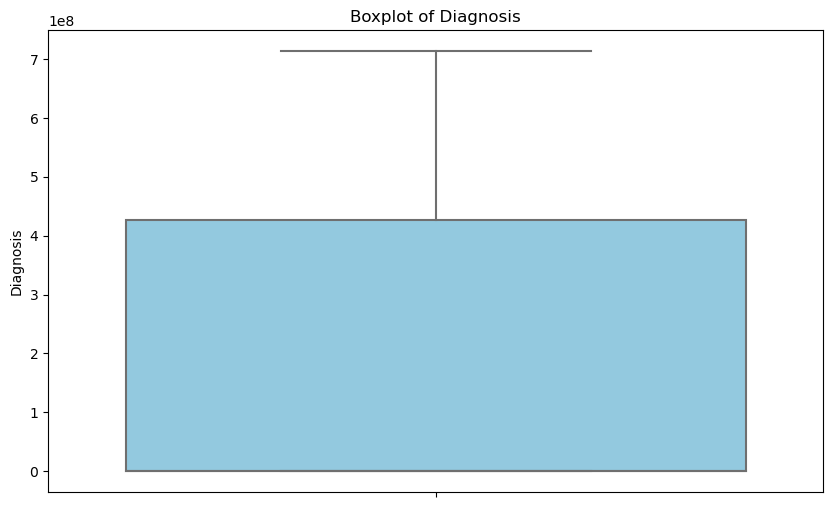

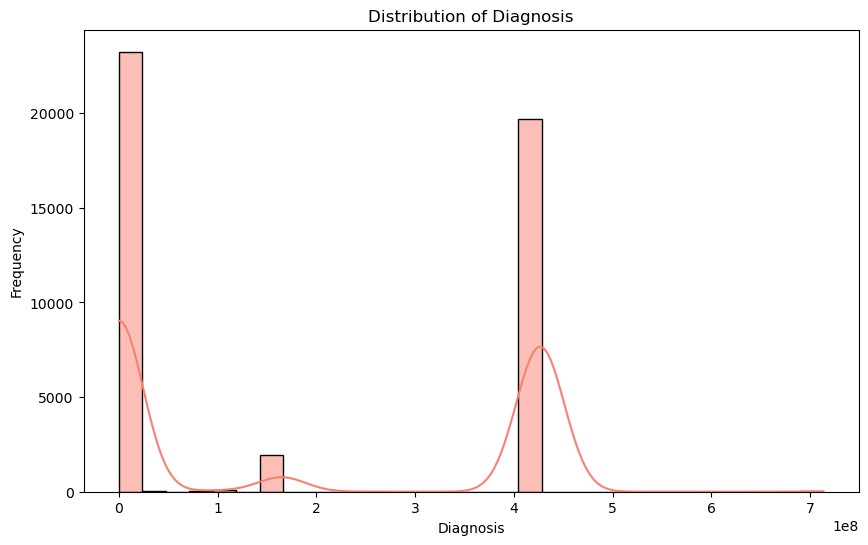

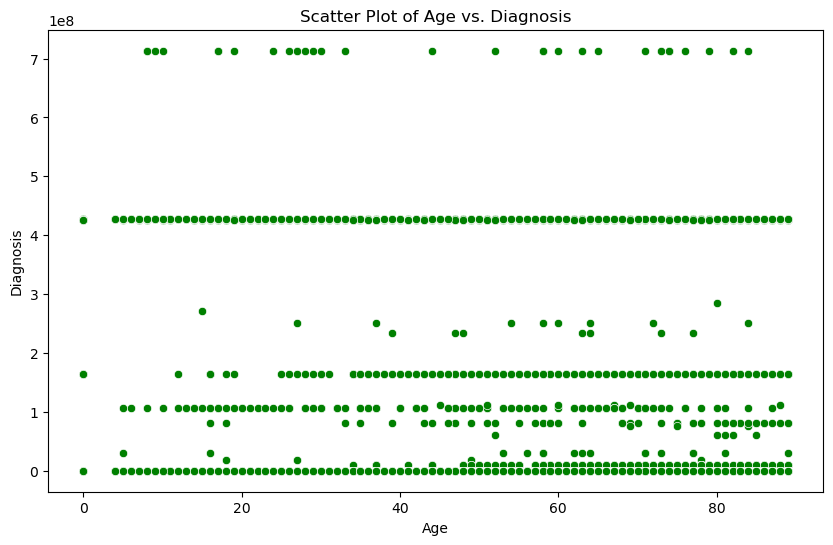

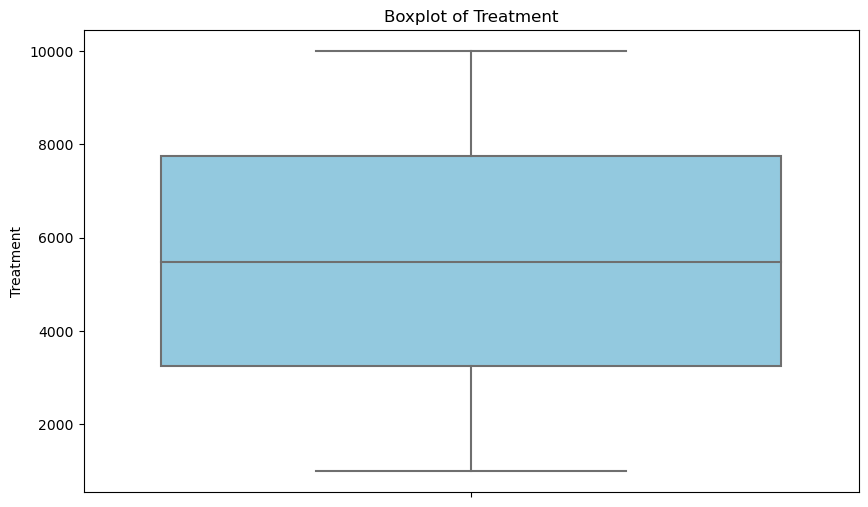

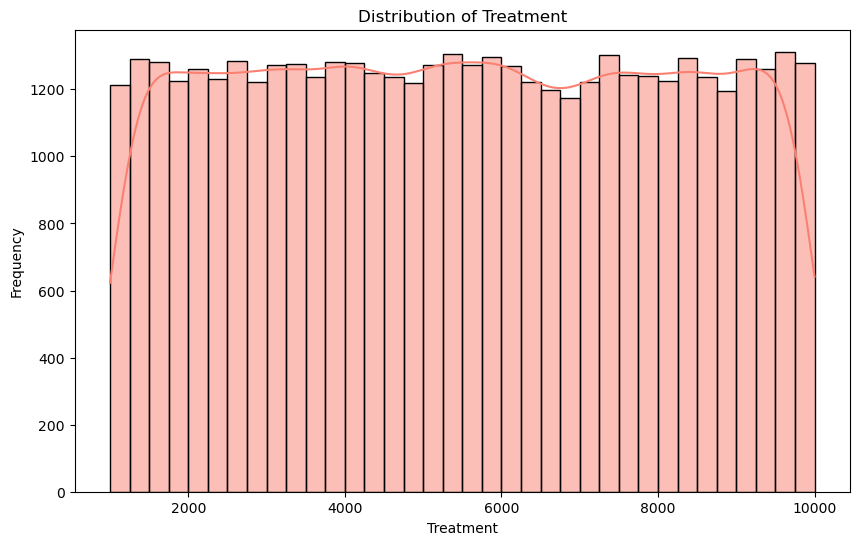

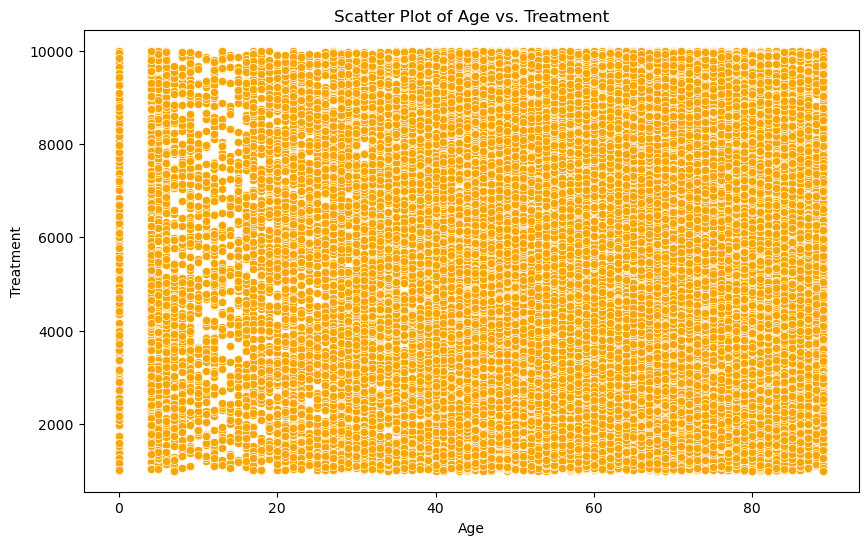

In [56]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import os

# Load the dataset
directory_path = r'F:\docouments\Data science\assingment 3'
csv_file_path = os.path.join(directory_path, 'patient_record_numeric.csv')
data = pd.read_csv(csv_file_path)

# Rename the columns
data.rename(columns={'dx': 'diagnosis', 'rx': 'treatment', 'hx': 'heart_disease', 'sx': 'symptom'}, inplace=True)

# Plot boxplot for age
plt.figure(figsize=(10, 6))
sns.boxplot(y=data['age'], color='skyblue')
plt.title('Boxplot of Age')
plt.ylabel('Age')
plt.show()

# Plot histogram for age
plt.figure(figsize=(10, 6))
sns.histplot(data['age'], kde=True, color='salmon')
plt.title('Distribution of Age')
plt.xlabel('Age')
plt.ylabel('Frequency')
plt.show()

# Plot boxplot for sex
plt.figure(figsize=(8, 6))
sns.boxplot(x=data['sex'], y=data['age'], palette='pastel')
plt.title('Boxplot of Age by Sex')
plt.xlabel('Sex')
plt.ylabel('Age')
plt.show()

# Plot boxplot for diagnosis
plt.figure(figsize=(10, 6))
sns.boxplot(y=data['diagnosis'], color='skyblue')
plt.title('Boxplot of Diagnosis')
plt.ylabel('Diagnosis')
plt.show()

# Plot histogram for diagnosis
plt.figure(figsize=(10, 6))
sns.histplot(data['diagnosis'], kde=True, color='salmon')
plt.title('Distribution of Diagnosis')
plt.xlabel('Diagnosis')
plt.ylabel('Frequency')
plt.show()

# Plot scatter plot between age and diagnosis
plt.figure(figsize=(10, 6))
sns.scatterplot(x='age', y='diagnosis', data=data, color='green')
plt.title('Scatter Plot of Age vs. Diagnosis')
plt.xlabel('Age')
plt.ylabel('Diagnosis')
plt.show()

# Plot boxplot for treatment
plt.figure(figsize=(10, 6))
sns.boxplot(y=data['treatment'], color='skyblue')
plt.title('Boxplot of Treatment')
plt.ylabel('Treatment')
plt.show()

# Plot histogram for treatment
plt.figure(figsize=(10, 6))
sns.histplot(data['treatment'], kde=True, color='salmon')
plt.title('Distribution of Treatment')
plt.xlabel('Treatment')
plt.ylabel('Frequency')
plt.show()

# Plot scatter plot between age and treatment
plt.figure(figsize=(10, 6))
sns.scatterplot(x='age', y='treatment', data=data, color='orange')
plt.title('Scatter Plot of Age vs. Treatment')
plt.xlabel('Age')
plt.ylabel('Treatment')
plt.show()

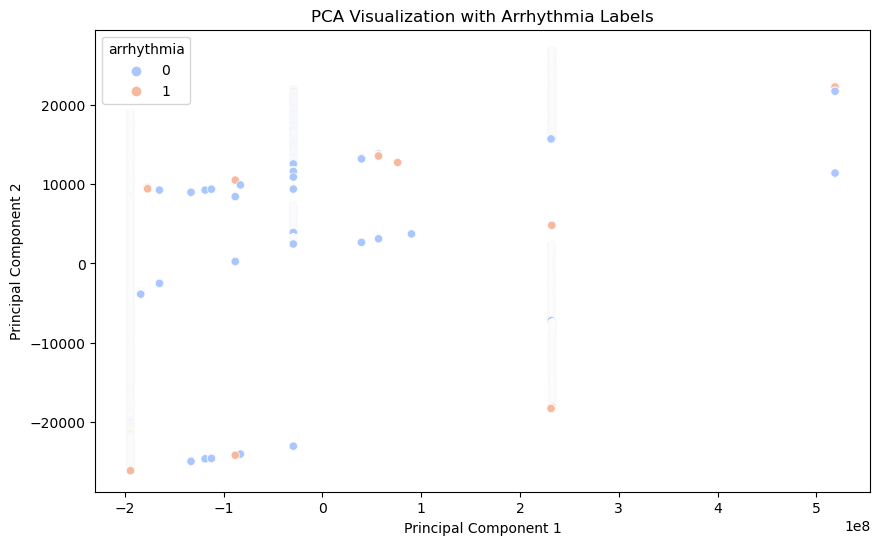

In [61]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA
from sklearn.preprocessing import OneHotEncoder
from sklearn.compose import ColumnTransformer
import os

# Load the dataset
directory_path = r'F:\docouments\Data science\assingment 3'
csv_file_path = os.path.join(directory_path, 'patient_record_numeric.csv')
data = pd.read_csv(csv_file_path)

# Encode the 'sex' column using one-hot encoding
data = pd.get_dummies(data, columns=['sex'], drop_first=True)  # Drop first column to avoid multicollinearity

# Create a new column for arrhythmia based on age
data['arrhythmia'] = data['age'].apply(lambda x: 1 if x < 60 else 0)

# Perform PCA for dimensionality reduction
pca = PCA(n_components=2)  # Reduce to 2 dimensions for visualization
X_pca = pca.fit_transform(data.drop(columns=['age', 'arrhythmia']))  # Drop age and arrhythmia columns for PCA

# Plot the lower-dimensional representation of the data points with arrhythmia labels
plt.figure(figsize=(10, 6))
sns.scatterplot(x=X_pca[:, 0], y=X_pca[:, 1], hue=data['arrhythmia'], palette='coolwarm', legend='full')
plt.title('PCA Visualization with Arrhythmia Labels')
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.show()